# Combining Hough and Canny Algorithms
## Week 12
The Hough transform is a technique which can be used to isolate features of a particular shape within an image. Because it requires that the desired features be specified in some parametric form, the classical Hough transform is most commonly used for the detection of regular curves such as lines, circles, ellipses, etc. A generalized Hough transform can be employed in applications where a simple analytic description of a feature(s) is not possible. Due to the computational complexity of the generalized Hough algorithm, we restrict the main focus of this discussion to the classical Hough transform. Despite its domain restrictions, the classical Hough transform (hereafter referred to without the classical prefix) retains many applications, as most manufactured parts (and many anatomical parts investigated in medical imagery) contain feature boundaries which can be described by regular curves. The main advantage of the Hough transform technique is that it is tolerant of gaps in feature boundary descriptions and is relatively unaffected by image noise.

<p align="center"><img src="http://sharky93.github.io/docs/gallery/_images/plot_line_hough_transform_1.png"></p>

---

## Canny Algorithm by John Canny
This paper describes a computational approach to edge detection. The success of the approach depends on the definition of a comprehensive set of goals for the computation of edge points. These goals must be precise enough to delimit the desired behavior of the detector while making minimal assumptions about the form of the solution.
[A Computational Approach to Edge Detection](https://ieeexplore.ieee.org/abstract/document/4767851)

In [31]:
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import cv2
from math import sqrt, atan2, pi
from PIL import Image, ImageDraw

In [32]:
# hdulist = fits.open("m16_nircam.fits")
# hdulist.info()

## Visaulization

## Applying Otsu & Binary Thresholding

In [33]:
# This image was obtained earlier
img = cv2.imread("pillars4.png")

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
filtered = cv2.medianBlur(gray, 1)
binary, threshold = cv2.threshold(filtered, 100, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

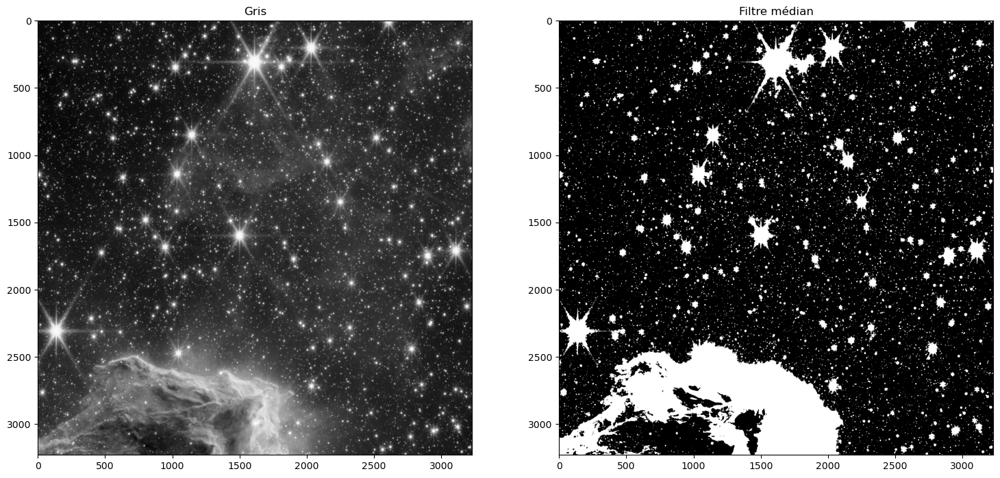

In [34]:
import matplotlib.pyplot as plt

# Set the figure size
f, axarr = plt.subplots(1, 2)  # Create a figure with 1 row and 2 columns
f.set_size_inches(18, 15)

# Display the grayscale image
axarr[0].imshow(gray, cmap='gray')
axarr[0].set_title('Gris')

# Display the filtered image
axarr[1].imshow(threshold, cmap='gray')
axarr[1].set_title('Filtre médian')

# Show the figure
plt.show()


<Figure size 2000x2000 with 0 Axes>

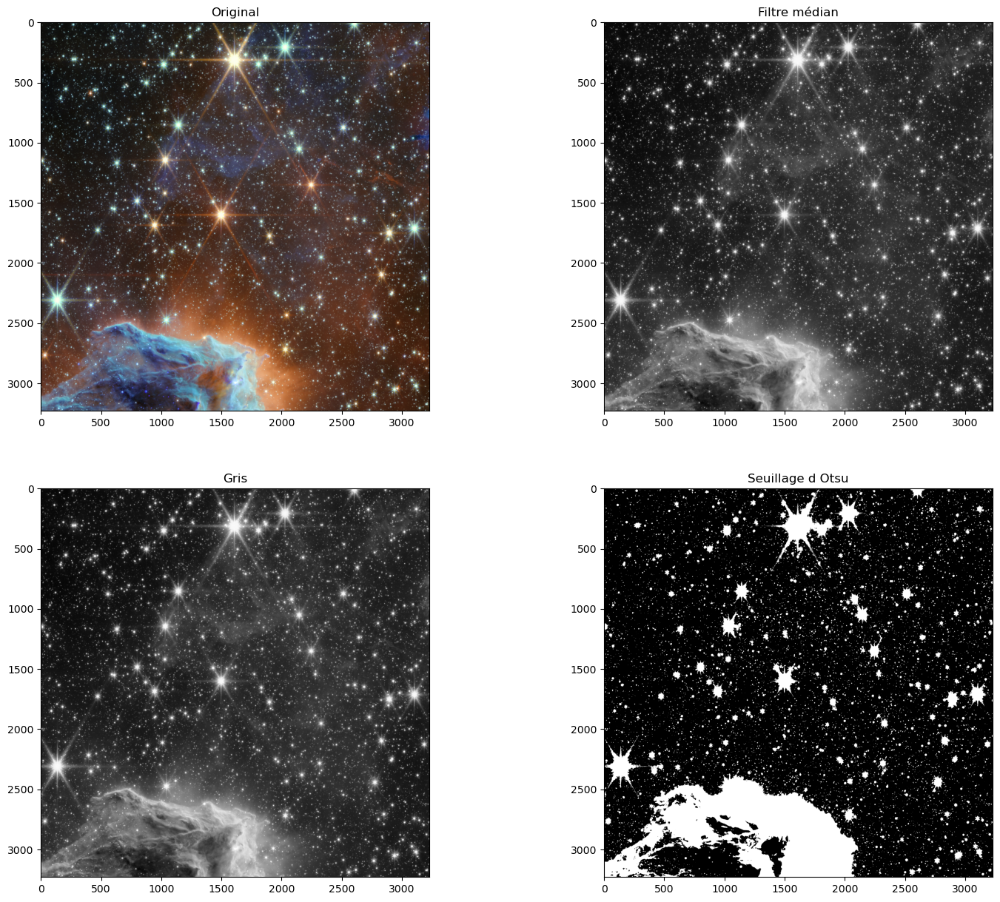

In [35]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 20))
f, axarr = plt.subplots(2, 2)
f.set_size_inches(18, 15)

# Display images
axarr[0, 0].imshow(img)  # Display the original image in its original color
axarr[0, 0].set_title('Original')

axarr[1, 0].imshow(gray, cmap='gray')  # Display the grayscale image
axarr[1, 0].set_title('Gris')

axarr[0, 1].imshow(filtered, cmap='gray')  # Display the filtered image
axarr[0, 1].set_title('Filtre médian')

axarr[1, 1].imshow(threshold, cmap='gray')  # Display the threshold image
axarr[1, 1].set_title('Seuillage d Otsu')

plt.show()


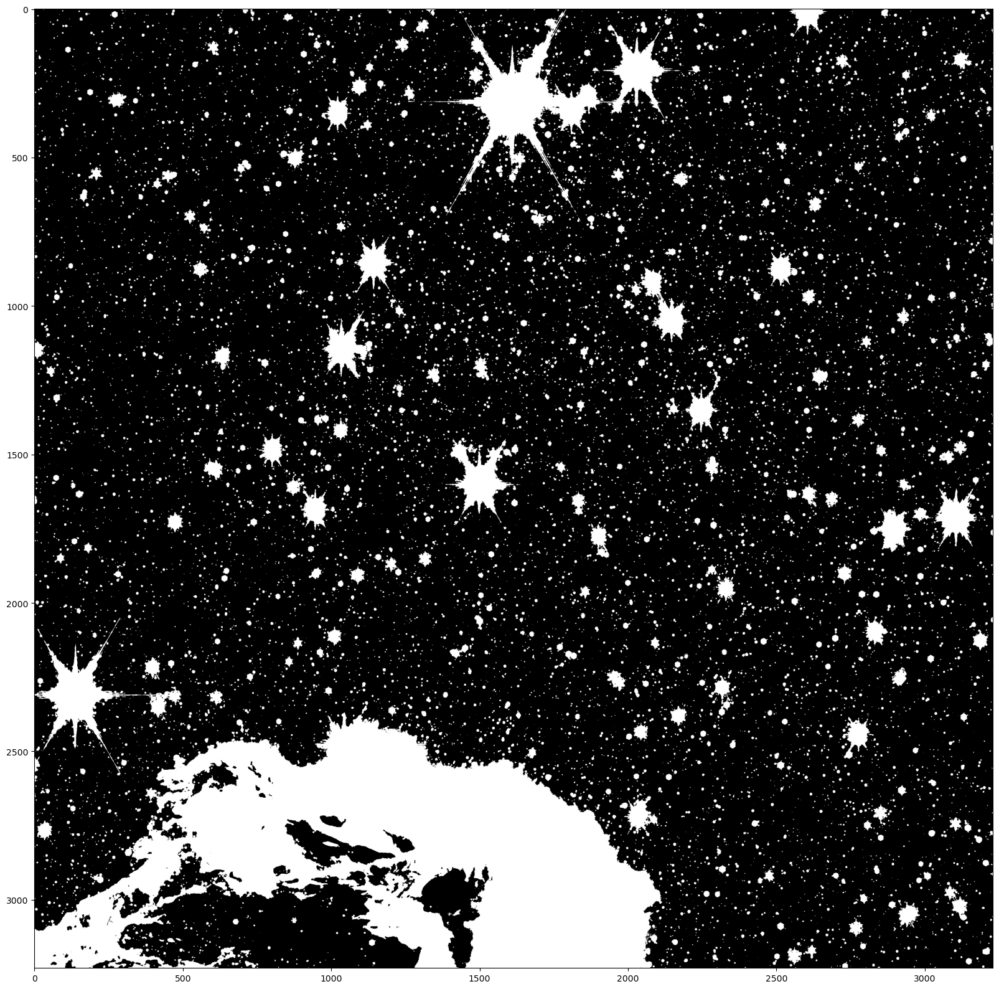

In [36]:
cv2.imwrite('otsu_processed_image.jpg', threshold)
img = cv2.imread("otsu_processed_image.jpg")
plt.figure(figsize = (20,20))
plt.imshow(img)

## Hough Circle Detection vs. Rectangle Detection Algorithm
Running on a small piece of the image.

(3230, 3230, 3)


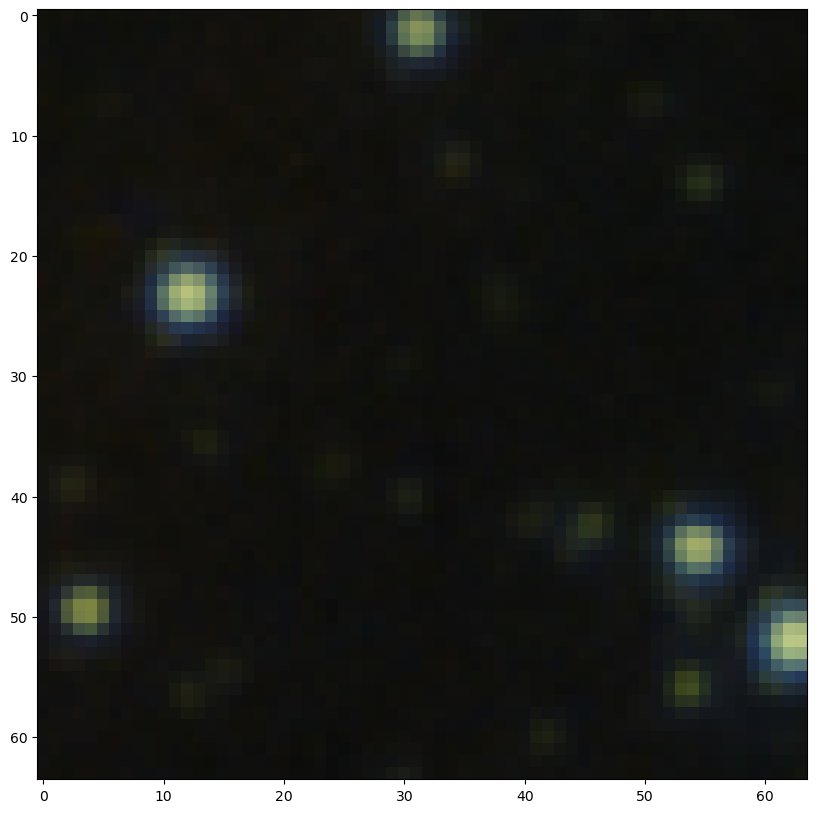

In [37]:
threshold_small = cv2.imread("pillars4.png")
print(np.shape(threshold_small))
threshold_small = threshold_small[:64, :64]
plt.figure(figsize=(10,10))
plt.imshow(threshold_small)

## Rectangle Detection
Now, using the `findContours()` function in OpenCV, the number of edges, which corresponds to the total number of shapes, is going to be counted.

For the purposes of checking the initial result, a smaller piece of the image has been selected; a $64 \times 64$ square to be exact.

Number of rectangles in the 64*64 square: 0


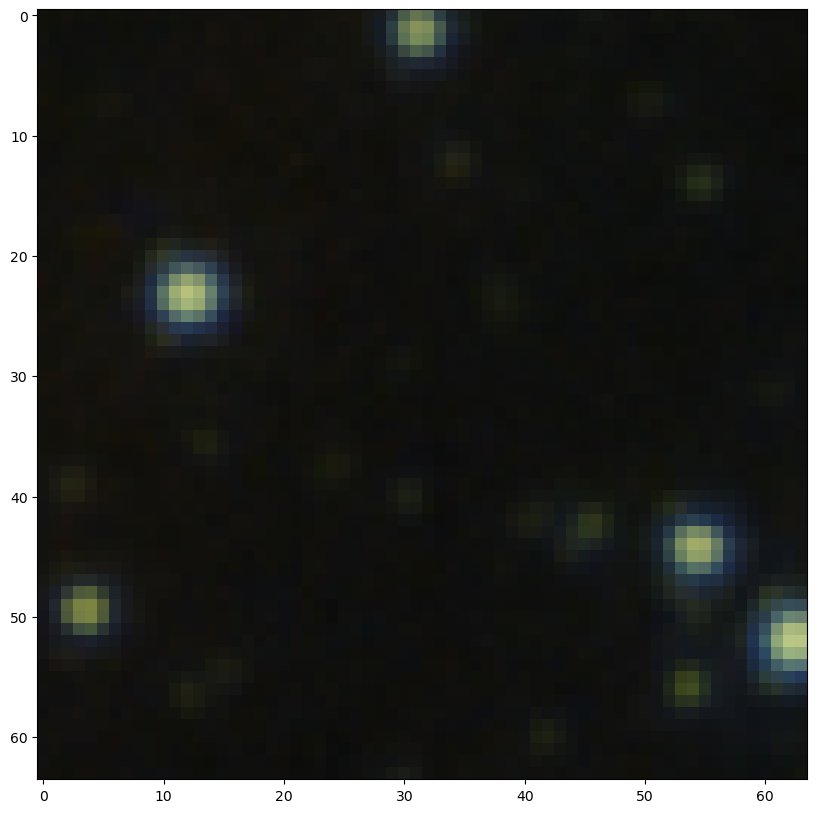

In [38]:
contours, _ = cv2.findContours(threshold[:100, :100], cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

plt.figure(figsize=(10,10))
plt.imshow(threshold_small)

counter = 0

for c in contours:
  epsilon = 0.1*cv2.arcLength(c, True)
  approx = cv2.approxPolyDP(c, epsilon, True)
  if len(approx) == 1:
    counter += 1

print(f'Number of rectangles in the 64*64 square: {counter}')

Now counting the rectangles on the whole image:

Number of rectangles in the whole image: 1026


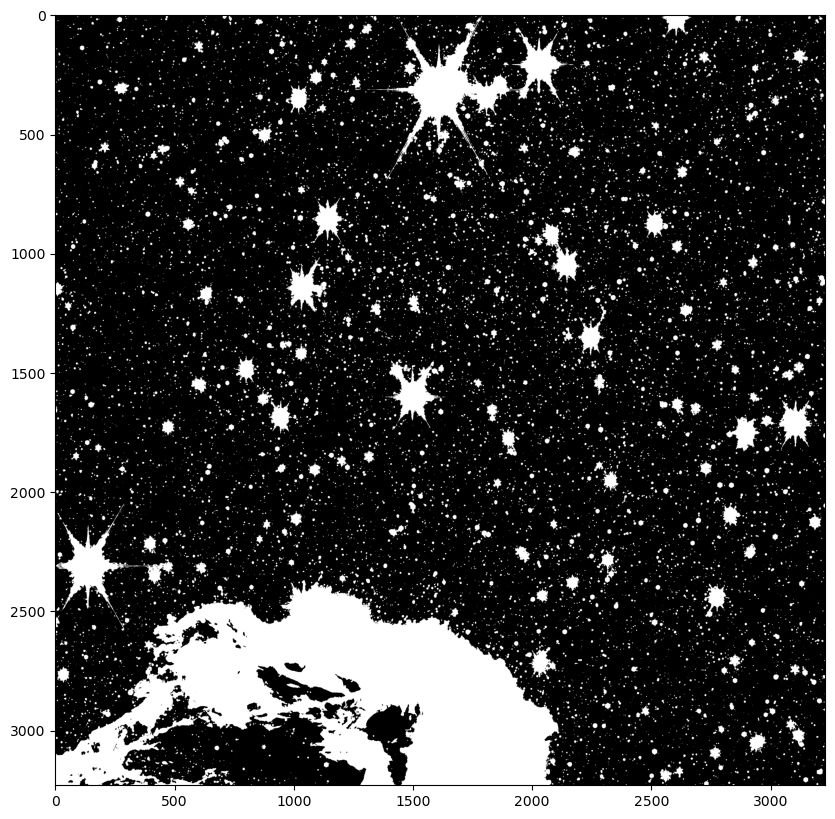

In [39]:
contours, _ = cv2.findContours(threshold, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

plt.figure(figsize=(10,10))
plt.imshow(threshold, cmap="gray")

counter = 0

for c in contours:
  epsilon = 0.1*cv2.arcLength(c, True)
  approx = cv2.approxPolyDP(c, epsilon, True)
  if len(approx) == 1:
    # Increment the counter
    counter += 1
print(f'Number of rectangles in the whole image: {counter}')

## Results
The results seem reasonable, since the average number of stars reported by manually counting such areas has only a $10 \%$ difference with the results reported.

## On a Smaler Scale

Number of rectangles in the 64*64 square: 0


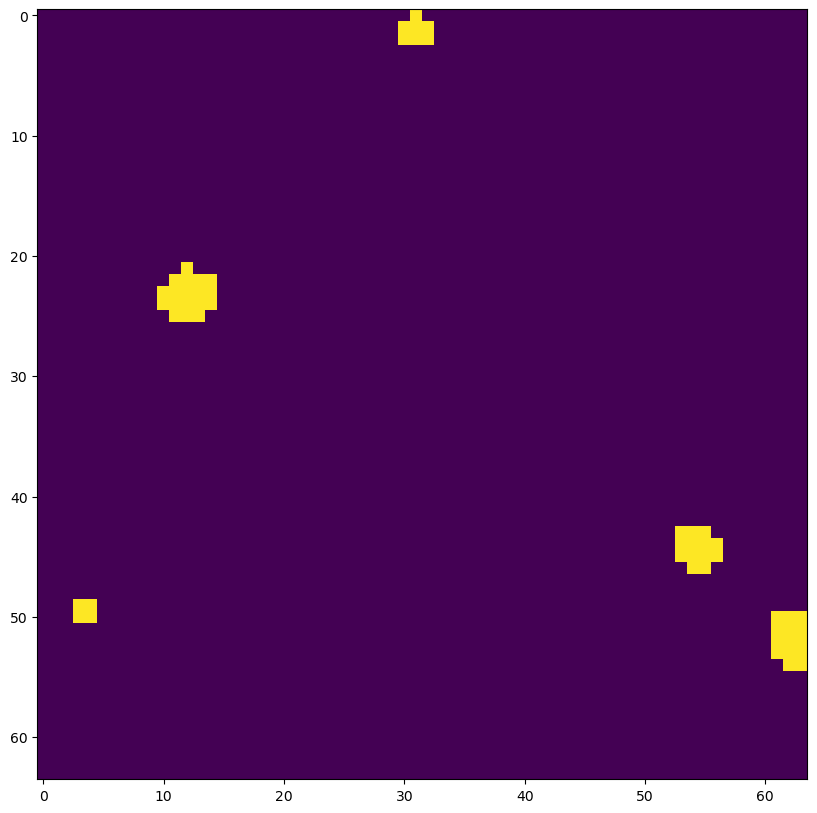

In [47]:
edges_small = threshold[:64, :64]

contours, _ = cv2.findContours(threshold[:64, :64], cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

plt.figure(figsize=(10,10))
plt.imshow(edges_small)

# Initialize a counter
counter = 0

# Loop over the contours
for c in contours:
    # Check if the contour is a rectangle
    # 0.6 gives a reasonable approximation
    epsilon = 0.1*cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, epsilon, True)
    if len(approx) == 1:
        # Increment the counter
        counter += 1

# Print the number of rectangles
print(f'Number of rectangles in the 64*64 square: {counter}')

Number of rectangles in the whole image: 12833


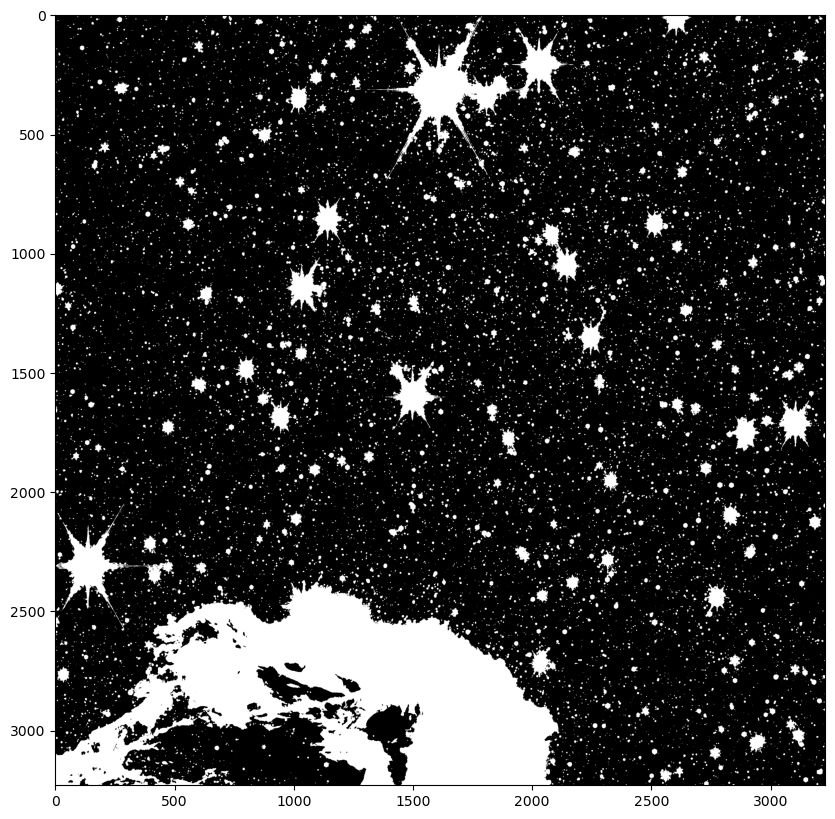

In [41]:
contours, _ = cv2.findContours(threshold, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

plt.figure(figsize=(10,10))
plt.imshow(threshold, cmap="gray")

counter = 0

for c in contours:
    epsilon = 0.6*cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, epsilon, True)
    if len(approx) == 1:
        counter += 1

print(f'Number of rectangles in the whole image: {counter}')

## Applying Canny Edge Detection Algorithm

### On Original Image
This image has no filtering or blurring perfomed on it.

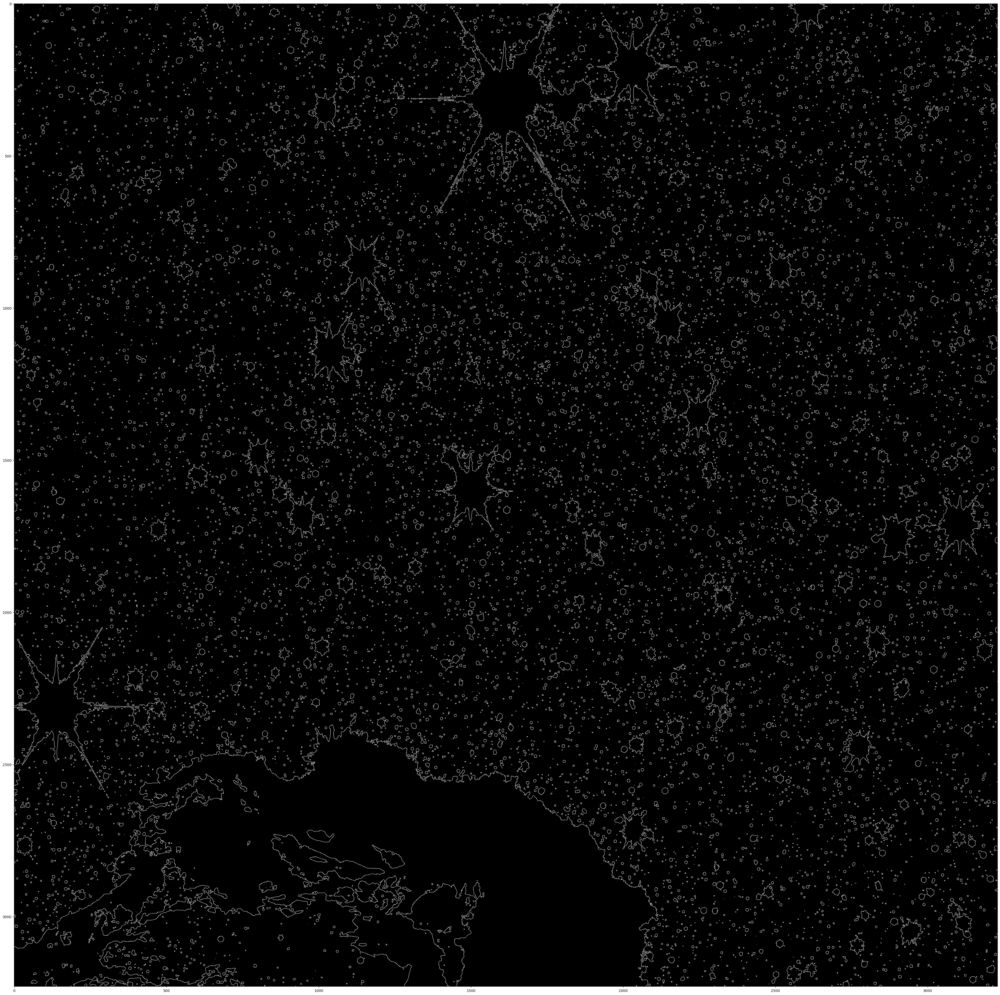

In [42]:
edges = cv2.Canny(img,100,200)

contours, hierarchy = cv2.findContours(edges, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

plt.figure(figsize = (50,50))
plt.imshow(edges, "gray")

In [43]:
results = []

for i in range(len(contours)):
    #initialize the parameters in e
    max_x = float('-inf')
    min_x = float('inf')
    max_y = float('-inf')
    min_y = float('inf')
    for j in range(len(contours[i])):
        x, y = contours[i][j][0]  # Unpack the X and Y values from the tuple
        max_x = max(max_x, x)  # Update the maximum X value if necessary
        min_x = min(min_x, x)  # Update the minimum X value if necessary
        max_y = max(max_y, y)  # Update the maximum Y value if necessary
        min_y = min(min_y, y)  # Update the minimum Y value if necessary
    results.append([min_x, max_x, min_y, max_y])

In [44]:
len(results)

25281

KeyboardInterrupt: 

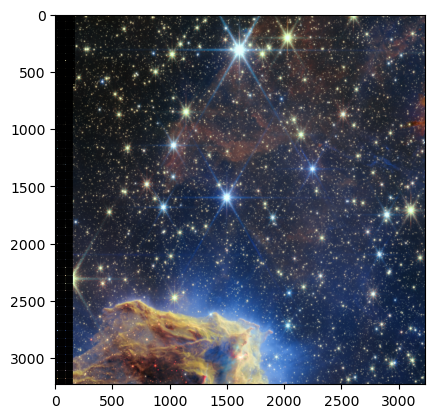

In [45]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def add_grid(ax, image_shape, grid_size):
    # Adds a grid overlay to the plot.
    for x in range(0, image_shape[1], grid_size):
        for y in range(0, image_shape[0], grid_size):
            rect = patches.Rectangle((x, y), grid_size, grid_size, linewidth=0.5, edgecolor='black', facecolor='none')
            ax.add_patch(rect)

def plot_image_matrix(image_path, grid_size=10):
    # Load image
    img = Image.open(image_path)
    data = np.array(img)

    # Create plot
    fig, ax = plt.subplots()
    ax.imshow(data)
    add_grid(ax, data.shape, grid_size)

    # Customizing the plot's appearance
    ax.set_xticks(np.arange(-0.5, data.shape[1], grid_size), minor=True)
    ax.set_yticks(np.arange(-0.5, data.shape[0], grid_size), minor=True)
    ax.grid(which='minor', color='black', linestyle='-', linewidth=0.5)
    ax.tick_params(which='minor', size=0)

    # Remove tick labels
    ax.set_xticklabels([])
    ax.set_yticklabels([])

    # Show the plot
    plt.show()

# Specify the path to your image
image_path = 'pillars4.png'
plot_image_matrix(image_path, grid_size=10)


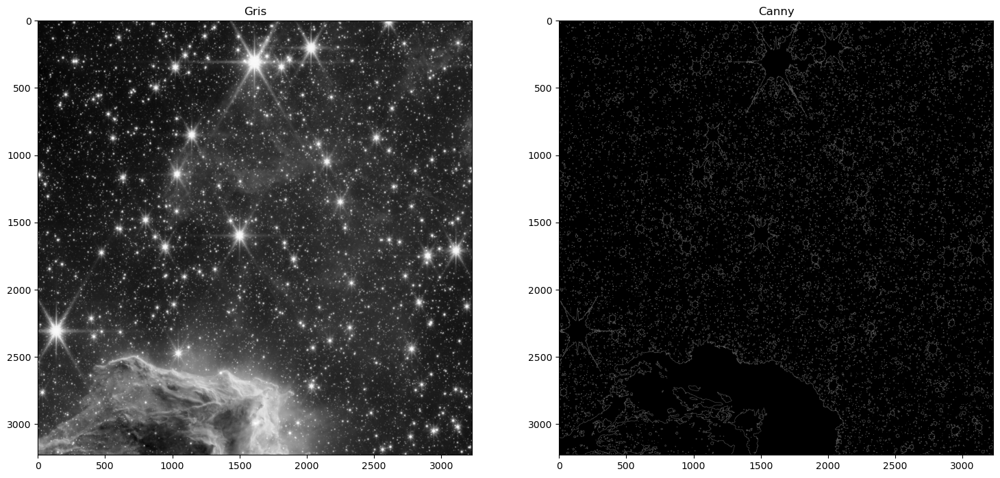

In [ ]:
import matplotlib.pyplot as plt

# Set the figure size
f, axarr = plt.subplots(1, 2)  # Create a figure with 1 row and 2 columns
f.set_size_inches(18, 15)

# Display the grayscale image
axarr[0].imshow(gray, cmap='gray')
axarr[0].set_title('Gris')

# Display the filtered image
axarr[1].imshow(edges, cmap='gray')
axarr[1].set_title('Canny')

# Show the figure
plt.show()